In [0]:
pip install https://github.com/pandas-profiling/pandas-profiling/archive/master.zip

In [0]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np
import plotly.express as px
import plotly.graph_objects as go
import warnings
warnings.filterwarnings('ignore')
from sklearn.metrics import mean_squared_error
from statsmodels.tools.eval_measures import rmse

In [0]:
df = pd.read_csv('AEP_hourly.csv')

In [4]:
df

,Datetime,AEP_MW
0,2004-12-31 01:00:00,13478.0
1,2004-12-31 02:00:00,12865.0
2,2004-12-31 03:00:00,12577.0
3,2004-12-31 04:00:00,12517.0
4,2004-12-31 05:00:00,12670.0
...,...,...
121268,2018-01-01 20:00:00,21089.0
121269,2018-01-01 21:00:00,20999.0
121270,2018-01-01 22:00:00,20820.0
121271,2018-01-01 23:00:00,20415.0


#Infomation of Data

In [0]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 121273 entries, 0 to 121272
Data columns (total 2 columns):
 #   Column    Non-Null Count   Dtype  
---  ------    --------------   -----  
 0   Datetime  121273 non-null  object 
 1   AEP_MW    121273 non-null  float64
dtypes: float64(1), object(1)
memory usage: 1.9+ MB


In [0]:
df.describe()

,AEP_MW
count,121273.000000
mean,15499.513717
std,2591.399065
min,9581.000000
25%,13630.000000
50%,15310.000000
75%,17200.000000
max,25695.000000


Checking for null values

In [0]:
df.isna().sum()

Datetime    0
AEP_MW      0
dtype: int64

#Checking for Highest and Lowest consumption & Which Year 

In [0]:
df[df['AEP_MW'] == df['AEP_MW'].max()]

,Datetime,AEP_MW
30221,2008-10-20 14:00:00,25695.0


In [0]:
df[df['AEP_MW'] == df['AEP_MW'].min()]

,Datetime,AEP_MW
100759,2016-10-02 05:00:00,9581.0


**Conclusion:** The Maximum Energy Consumed was 25695mW on September 20, 2008 at 14:00:00 and Minimum was 9581mW on September 02, 2016 at 05:00:00.

#Visualisation of Data

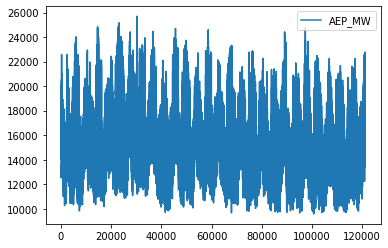

In [0]:
df.plot()

* Distribution Plot of the Energy Consumption

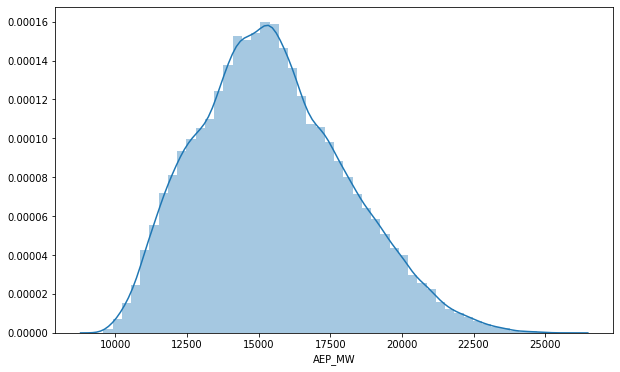

In [0]:
plt.figure(figsize=(10,6))
sns.distplot(df['AEP_MW'])
plt.show()

* Line Plot of Energy and total Consumption of Energy per Year

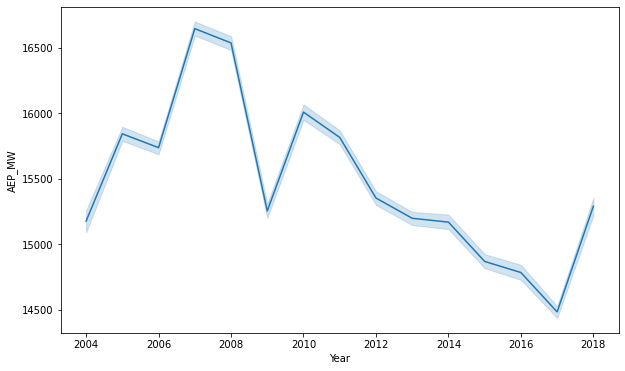

In [0]:
df1 = df.copy()
df1['Year']= pd.to_datetime(df1['Datetime']).dt.year
plt.figure(figsize=(10,6))
sns.lineplot(y=df1['AEP_MW'], x=df1['Year'], data=df1)
plt.show()

#Data Cleaning

In [6]:
df['Datetime'] = pd.to_datetime(df['Datetime'])
df.sort_values(by=['Datetime'], axis=0, ascending=True, inplace=True)
df.reset_index(inplace=True, drop=True)
df.head(2)

,Datetime,AEP_MW
0,2004-10-01 01:00:00,12379.0
1,2004-10-01 02:00:00,11935.0


Deduplicate, only keeping the last measurement per datetime.

In [0]:
df.drop_duplicates(subset='Datetime', keep='last', inplace=True)

Checking if our dataset is continous or not.

In [8]:
df = df.set_index('Datetime')
print('df.index.freq is set to:', df.index.freq)

df.index.freq is set to: None


The fact our datetime index's frequency is set to None is an indication there are some missing data points somewhere (otherwise Python could deduce it). Let's compare it to an uninterruped custom date range.

In [0]:
#Creating a custom date range
date_range = pd.date_range(start=min(df.index), end=max(df.index), freq='H')

In [10]:
print('The difference in length between the custom date range and our dataset is', (len(date_range)-len(df)))
print(date_range.difference(df.index))

The difference in length between the custom date range and our dataset is 27
DatetimeIndex(['2004-10-31 02:00:00', '2005-04-03 03:00:00',
               '2005-10-30 02:00:00', '2006-04-02 03:00:00',
               '2006-10-29 02:00:00', '2007-03-11 03:00:00',
               '2007-11-04 02:00:00', '2008-03-09 03:00:00',
               '2008-11-02 02:00:00', '2009-03-08 03:00:00',
               '2009-11-01 02:00:00', '2010-03-14 03:00:00',
               '2010-11-07 02:00:00', '2010-12-10 00:00:00',
               '2011-03-13 03:00:00', '2011-11-06 02:00:00',
               '2012-03-11 03:00:00', '2012-11-04 02:00:00',
               '2012-12-06 04:00:00', '2013-03-10 03:00:00',
               '2013-11-03 02:00:00', '2014-03-09 03:00:00',
               '2014-03-11 14:00:00', '2015-03-08 03:00:00',
               '2016-03-13 03:00:00', '2017-03-12 03:00:00',
               '2018-03-11 03:00:00'],
              dtype='datetime64[ns]', freq=None)


Let's reindex our dataset and then perform imputation.

In [0]:
#Using this will append missing datatime and create null values in target variable
df = df.reindex(date_range)

In [0]:
#Using interpolate we will fill the null values with values that lies on a linear curve between existing data points
df['AEP_MW'].interpolate(method='linear', inplace=True)

In [13]:
#Now checking for the continous datetime index
print('The df.index.freq is now:', df.index.freq, 'indicating that we no longer have missing instances')

The df.index.freq is now: <Hour> indicating that we no longer have missing instances


In [14]:
df.head(2)

,AEP_MW
2004-10-01 01:00:00,12379.0
2004-10-01 02:00:00,11935.0


#Extracting Time Feature

In [0]:
df['dow'] = df.index.dayofweek
df['doy'] = df.index.dayofyear
df['year'] = df.index.year
df['month'] = df.index.month
df['quarter'] = df.index.quarter
df['hour'] = df.index.hour
df['weekday'] = df.index.day_name()
df['woy'] = df.index.weekofyear
df['dom'] = df.index.day # Day of Month
df['date'] = df.index.date 

#Adding season number
df['season'] = df['month'].apply(lambda month_number: (month_number%12 + 3)//3)

In [16]:
df.head(3)

,AEP_MW,dow,doy,year,month,quarter,hour,weekday,woy,dom,date,season
2004-10-01 01:00:00,12379.0,4,275,2004,10,4,1,Friday,40,1,2004-10-01,4
2004-10-01 02:00:00,11935.0,4,275,2004,10,4,2,Friday,40,1,2004-10-01,4
2004-10-01 03:00:00,11692.0,4,275,2004,10,4,3,Friday,40,1,2004-10-01,4


#EDA

In [0]:
import pandas_profiling
from pandas_profiling import ProfileReport
eda = pandas_profiling.ProfileReport(df)

In [0]:
eda

#Plotting Energy Consumption Over Time

In [17]:
df['date_and_time'] = df.index

fig = px.line(df,
              x='date_and_time',
              y='AEP_MW',
              title=f'Power Demand (MW) over time [{min(df.year)} - {max(df.year)}]')
fig.update_traces(line=dict(width=0.05))
fig.update_layout(xaxis_title='Date & Time (yyyy/mm/dd hh:MM)',
                  yaxis_title='Energy Demand [MW]')
fig.show()

We can clearly identify a seasonal pattern in above plot.

In [0]:
dt = df\
    .groupby(['hour', 'weekday'], as_index=False)\
    .agg({'AEP_MW':'median'})

fig = px.line(dt, 
              x='hour', 
              y='AEP_MW', 
              color='weekday', 
              title='Median Hourly Power Demand per Weekday')
fig.update_layout(xaxis_title='Hour',
                  yaxis_title='Energy Demand [MW]')
fig.show()

From above plot we can tell that energy demand is comperatively low on weekends and dip a little sooner on friday afternoon.

In [0]:
ds = df\
    .groupby(['hour', 'season'], as_index=False)\
    .agg({'AEP_MW':'median'})

fig = px.line(ds,
              x='hour', 
              y='AEP_MW', 
              color='season', 
              title='Median Hourly Power Demand per Season')
fig.update_layout(xaxis_title='Hour',
                  yaxis_title='Energy Demand [MW]')
fig.show()

Season 3 has the highest demand of energy.

#Decomposing the Time Series

In [0]:
from statsmodels.tsa.seasonal import seasonal_decompose

series = df[['AEP_MW']]
frequency = 24*365

#Decomposing the time-series, with the frequency being 24 hours per 365 days
decomposed = seasonal_decompose(series, model='additive', freq=frequency)

In [26]:
def plot_decompositions(decompositions, titles, line_widths):
    for d, t, lw in zip(decompositions, titles, line_widths):
        
        fig = px.line(d,
              y=df['AEP_MW'],
              title=t,
              height=300)
        
        fig.update_traces(line=dict(width=lw))
        
        fig.update_layout(
            xaxis=dict(
                showticklabels=False,
                linewidth=1
            ),
            yaxis=dict(title=''),
            margin=go.layout.Margin(
                l=40, r=40, b=0, t=40, pad=0
            ),
        )
        
        fig.show()


plot_decompositions(decompositions=[decomposed.trend, 
                                    decomposed.seasonal, 
                                    decomposed.resid],
                    titles=['Trend', 
                            'Seasonality',
                            'Residuals'],
                    line_widths=[2, 0.025, 0.05])

#Dickie Fuller Test for stationarity

In [0]:
from statsmodels.tsa.stattools import adfuller
def adfuller_test(ts):
  adfuller_result = adfuller(ts, autolag=None)
  adfuller_out = pd.Series(adfuller_result[0:4],
  index=["Test Statistic","p-value","Lags Used","Number of Observations Used"])
  print(adfuller_out)
  if adfuller_out.iloc[1]> 0.05:
    print('Data is NOT stationary')
  else:
    print('Data is stationary')

In [0]:
adfuller_test(df.AEP_MW)

Test Statistic                -1.824617e+01
p-value                        2.348702e-30
Lags Used                      7.100000e+01
Number of Observations Used    1.212240e+05
dtype: float64
Data is stationary


#Train/Test

In [18]:
print('The last date time point in our dataframe is:', max(df.index))

The last date time point in our dataframe is: 2018-08-03 00:00:00


In [0]:
split_date = pd.to_datetime('2017-08-01')
TIME_DELTA = pd.DateOffset(years=8)

train = df.loc[(df.index < split_date) & (df.index >= split_date-TIME_DELTA) ].copy()
test = df.loc[df.index >= split_date].copy()

In [20]:
print(f'Training shape: {train.shape} \nTesting shape: {test.shape}\n')
print(f'The training set lies between the dates: {min(train.index)} and {max(train.index)}')
print(f'For the testing set, the dates are: {min(test.index)} and {max(test.index)}')

Training shape: (70128, 13) 
Testing shape: (8809, 13)

The training set lies between the dates: 2009-08-01 00:00:00 and 2017-07-31 23:00:00
For the testing set, the dates are: 2017-08-01 00:00:00 and 2018-08-03 00:00:00


In [21]:
train

,AEP_MW,dow,doy,year,month,quarter,hour,weekday,woy,dom,date,season,date_and_time
2009-08-01 00:00:00,14247.0,5,213,2009,8,3,0,Saturday,31,1,2009-08-01,3,2009-08-01 00:00:00
2009-08-01 01:00:00,13033.0,5,213,2009,8,3,1,Saturday,31,1,2009-08-01,3,2009-08-01 01:00:00
2009-08-01 02:00:00,12326.0,5,213,2009,8,3,2,Saturday,31,1,2009-08-01,3,2009-08-01 02:00:00
2009-08-01 03:00:00,11713.0,5,213,2009,8,3,3,Saturday,31,1,2009-08-01,3,2009-08-01 03:00:00
2009-08-01 04:00:00,11356.0,5,213,2009,8,3,4,Saturday,31,1,2009-08-01,3,2009-08-01 04:00:00
...,...,...,...,...,...,...,...,...,...,...,...,...,...
2017-07-31 19:00:00,19704.0,0,212,2017,7,3,19,Monday,31,31,2017-07-31,3,2017-07-31 19:00:00
2017-07-31 20:00:00,19077.0,0,212,2017,7,3,20,Monday,31,31,2017-07-31,3,2017-07-31 20:00:00
2017-07-31 21:00:00,18344.0,0,212,2017,7,3,21,Monday,31,31,2017-07-31,3,2017-07-31 21:00:00
2017-07-31 22:00:00,17759.0,0,212,2017,7,3,22,Monday,31,31,2017-07-31,3,2017-07-31 22:00:00


#Forecasting Models

* **Simple Exponential Smoothening**

In [0]:
from statsmodels.tsa.holtwinters import SimpleExpSmoothing
SES_fitted = SimpleExpSmoothing(train.AEP_MW).fit()

In [40]:
SES_forecast = SES_fitted.forecast(len(test['AEP_MW']))
SES_forecast.values

array([16468., 16468., 16468., ..., 16468., 16468., 16468.])

In [0]:
#Visualising Smoothened curve
fig = go.Figure()
fig.add_trace(go.Scatter(x=test['AEP_MW'].index, y=test['AEP_MW'],
                         mode='lines',
                         name='Test - Ground Truth'))
fig.add_trace(go.Scatter(x=SES_forecast.index, y=SES_forecast,
                         mode='lines', 
                         name='Test - Prediction'))

fig.update_traces(line=dict(width=0.5))
fig.update_layout(title='Simple Exponential Smoothening Forecast of Hourly Energy Demand',
                  xaxis_title='Date & Time (yyyy/mm/dd hh:MM)',
                  yaxis_title='Energy Demand [MW]')

In [0]:
#Accuracy will be judged by following constraints
import numpy as np
def get_mape(actual, predicted):
  y_true, y_pred = np.array(actual), np.array(predicted)
  return np.round( np.mean(np.abs((actual - predicted) / actual))* 100, 2 )

In [0]:
mape_ses = get_mape(test['AEP_MW'],SES_forecast)
print('Our Simple Exponential Smoothening has a mean average percentage error of', mape_ses)

Our Simple Exponential Smoothening has a mean average percentage error of 17.64


In [41]:
ses_rmse = rmse(test['AEP_MW'], SES_forecast)
ses_mse = ses_rmse**2
mean_value = df['AEP_MW'].mean()

print(f'MSE Error: {ses_mse}\nRMSE Error: {ses_rmse}\nMean: {mean_value}')

MSE Error: 8203189.761068226
RMSE Error: 2864.1211149440287
Mean: 15499.149699907664


* **Triple Exponential Smoothening**

In [0]:
import statsmodels.api as sm
TSE =  sm.tsa.ExponentialSmoothing(train['AEP_MW'],
                                          seasonal_periods=24*365,
                                          seasonal='add').fit()

In [0]:
TSE_forecast = TSE.forecast(len(test['AEP_MW']))

In [24]:
fig = go.Figure()
fig.add_trace(go.Scatter(x=test['AEP_MW'].index, y=test['AEP_MW'],
                         mode='lines',
                         name='Test - Ground Truth'))
fig.add_trace(go.Scatter(x=TSE_forecast.index, y=TSE_forecast,
                         mode='lines', 
                         name='Test - Prediction'))

fig.update_traces(line=dict(width=0.5))
fig.update_layout(title='Triple Exponential Smoothening of Hourly Energy Demand',
                  xaxis_title='Date & Time (yyyy/mm/dd hh:MM)',
                  yaxis_title='Energy Demand [MW]')

In [0]:
mape_tse = get_mape(test['AEP_MW'],TSE_forecast)
print('Our Triple Exponential Smoothening has a mean average percentage error of', mape_tse)

Our Triple Exponential Smoothening has a mean average percentage error of 19.69


In [28]:
tse_rmse = rmse(test['AEP_MW'], TSE_forecast)
tse_mse = tse_rmse**2
mean_value = df['AEP_MW'].mean()

print(f'MSE Error: {tse_mse}\nRMSE Error: {tse_rmse}\nMean: {mean_value}')

MSE Error: 10743326.272305092
RMSE Error: 3277.70137021436
Mean: 15499.149699907664


> Day-wise predictions at the begining and the end of the forecast.

In [29]:
period = 24 * 7

x_true, y_true = test['AEP_MW'].iloc[:period].index, test['AEP_MW'].iloc[:period]
x_pred, y_pred = TSE_forecast.iloc[:period].index, TSE_forecast.iloc[:period]

fig = go.Figure()
fig.add_trace(go.Scatter(x=x_true, y=y_true,
                         mode='lines',
                         name='Test - Ground Truth'))
fig.add_trace(go.Scatter(x=x_pred, y=y_pred,
                         mode='lines', 
                         name='Test - Prediction'))

fig.update_traces(line=dict(width=0.9))
fig.update_layout(title=f'Exponential Forecast of First {period} Hours of Energy Demand',
                  xaxis_title='Date & Time (yyyy/mm/dd hh:MM)',
                  yaxis_title='Energy Demand [MW]')
fig.show()

In [0]:
print(f'MAPE for interval of the first {period} hours: {get_mape(y_true, y_pred)}')

MAPE for interval of the first 168 hours: 19.22


In [31]:
period = -24 * 7

x_true, y_true = test['AEP_MW'].iloc[period:].index, test['AEP_MW'].iloc[period:]
x_pred, y_pred = TSE_forecast.iloc[period:].index, TSE_forecast.iloc[period:]

fig = go.Figure()
fig.add_trace(go.Scatter(x=x_true, y=y_true,
                         mode='lines',
                         name='Test - Ground Truth'))
fig.add_trace(go.Scatter(x=x_pred, y=y_pred,
                         mode='lines', 
                         name='Test - Prediction'))

fig.update_traces(line=dict(width=0.9))
fig.update_layout(title=f'Exponential Forecast of Last {abs(period)} Hours of Energy Demand',
                  xaxis_title='Date & Time (yyyy/mm/dd hh:MM)',
                  yaxis_title='Energy Demand [MW]')
fig.show()

In [0]:
print(f'MAPE for interval of the last {abs(period)} hours: {get_mape(y_true, y_pred)}')

MAPE for interval of the last 168 hours: 19.73


* **Auto-Regressive Model**

In [0]:
from statsmodels.tsa.ar_model import AR,ARResults
model = AR(train.AEP_MW)

AR = model.fit(ic= 't-stat')

In [0]:
AR_predict = AR.predict(start= len(train), end= len(train)+len(test)-1)

In [0]:
fig = go.Figure()
fig.add_trace(go.Scatter(x=test['AEP_MW'].index, y=test['AEP_MW'],
                         mode='lines',
                         name='Test - Ground Truth'))
fig.add_trace(go.Scatter(x=AR_predict.index, y=AR_predict,
                         mode='lines', 
                         name='Test - Prediction'))

fig.update_traces(line=dict(width=0.5))
fig.update_layout(title='AR Model Prediction of Hourly Energy Demand',
                  xaxis_title='Date & Time (yyyy/mm/dd hh:MM)',
                  yaxis_title='Energy Demand [MW]')

In [0]:
mape_ar = get_mape(test['AEP_MW'],AR_predict)
print('Our AR Model has a mean average percentage error of', mape_ar)

Our AR Model has a mean average percentage error of 13.03


In [34]:
ar_rmse = rmse(test['AEP_MW'], AR_predict)
ar_mse = ar_rmse**2
mean_value = df['AEP_MW'].mean()

print(f'MSE Error: {ar_mse}\nRMSE Error: {ar_rmse}\nMean: {mean_value}')

MSE Error: 5491802.586333736
RMSE Error: 2343.459533752127
Mean: 15499.149699907664


* **Moving Average Using ARIMA Model**

In [35]:
from statsmodels.tsa.arima_model import ARIMA
model = ARIMA(train.AEP_MW, order=(0, 0, 1))
arima_model = model.fit()
arima_model.summary2()

<class 'statsmodels.iolib.summary2.Summary'>
"""
                             Results: ARMA
=======================================================================
Model:               ARMA             BIC:                 1209084.8040
Dependent Variable:  AEP_MW           Log-Likelihood:      -6.0453e+05 
Date:                2020-05-01 09:45 Scale:               1.0000      
No. Observations:    70128            Method:              css-mle     
Df Model:            2                Sample:              08-01-2009  
Df Residuals:        70126                                 07-31-2017  
Converged:           1.0000           S.D. of innovations: 1341.257    
No. Iterations:      3.0000           HQIC:                1209065.803 
AIC:                 1209057.3298                                      
-----------------------------------------------------------------------
               Coef.    Std.Err.     t     P>|t|    [0.025     0.975]  
-----------------------------------------------------------------------
const        15237.9737   9.8847 1541.5773 0.0000 15218.6002 15257.3473
ma.L1.AEP_MW     0.9516   0.0007 1341.1677 0.0000     0.9502     0.9530
---------------------------------------------------------------------------------
                  Real            Imaginary           Modulus           Frequency
---------------------------------------------------------------------------------
MA.1            -1.0508              0.0000            1.0508              0.5000
=======================================================================

"""

In [0]:
MA_predict = arima_model.predict(start= len(train), end= len(train)+len(test)-1)

In [0]:
fig = go.Figure()
fig.add_trace(go.Scatter(x=test['AEP_MW'].index, y=test['AEP_MW'],
                         mode='lines',
                         name='Test - Ground Truth'))
fig.add_trace(go.Scatter(x=MA_predict.index, y=MA_predict,
                         mode='lines', 
                         name='Test - Prediction'))

fig.update_traces(line=dict(width=0.5))
fig.update_layout(title='MA Model Prediction of Hourly Energy Demand',
                  xaxis_title='Date & Time (yyyy/mm/dd hh:MM)',
                  yaxis_title='Energy Demand [MW]')

In [42]:
mape_ma = get_mape(test['AEP_MW'],MA_predict)
print('Our MA Model has a mean average percentage error of', mape_ma)

Our MA Model has a mean average percentage error of 13.76


In [43]:
ma_rmse = rmse(test['AEP_MW'], MA_predict)
ma_mse = ma_rmse**2
mean_value = df['AEP_MW'].mean()

print(f'MSE Error: {ma_mse}\nRMSE Error: {ma_rmse}\nMean: {mean_value}')

MSE Error: 6031518.28251402
RMSE Error: 2455.914958322869
Mean: 15499.149699907664


* **ARMA Model**


Since our Time Series is Stationary as we checked this using Dickie Fuller Test for stationarity, we will use ARMA model.

In [44]:
from statsmodels.tsa.arima_model import ARIMA
model = ARIMA(train.AEP_MW, order=(2, 0, 1))
arima_model = model.fit()
arima_model.summary2()

<class 'statsmodels.iolib.summary2.Summary'>
"""
                             Results: ARMA
=======================================================================
Model:                ARMA             BIC:                 998329.6480
Dependent Variable:   AEP_MW           Log-Likelihood:      -4.9914e+05
Date:                 2020-05-01 10:07 Scale:               1.0000     
No. Observations:     70128            Method:              css-mle    
Df Model:             4                Sample:              08-01-2009 
Df Residuals:         70124                                 07-31-2017 
Converged:            1.0000           S.D. of innovations: 298.430    
No. Iterations:       6.0000           HQIC:                998297.979 
AIC:                  998283.8576                                      
-----------------------------------------------------------------------
               Coef.    Std.Err.     t     P>|t|    [0.025     0.975]  
-----------------------------------------------------------------------
const        15237.9737  33.8107  450.6852 0.0000 15171.7060 15304.2415
ar.L1.AEP_MW     1.6808   0.0030  557.9509 0.0000     1.6749     1.6867
ar.L2.AEP_MW    -0.7254   0.0030 -241.6085 0.0000    -0.7313    -0.7196
ma.L1.AEP_MW     0.3409   0.0040   85.2677 0.0000     0.3331     0.3487
---------------------------------------------------------------------------------
                  Real            Imaginary           Modulus           Frequency
---------------------------------------------------------------------------------
AR.1             1.1584             -0.1911            1.1741             -0.0260
AR.2             1.1584              0.1911            1.1741              0.0260
MA.1            -2.9335              0.0000            2.9335              0.5000
=======================================================================

"""

In [0]:
ARMA_predict = arima_model.predict(start= len(train), end= len(train)+len(test)-1)

In [0]:
fig = go.Figure()
fig.add_trace(go.Scatter(x=test['AEP_MW'].index, y=test['AEP_MW'],
                         mode='lines',
                         name='Test - Ground Truth'))
fig.add_trace(go.Scatter(x=ARMA_predict.index, y=ARMA_predict,
                         mode='lines', 
                         name='Test - Prediction'))

fig.update_traces(line=dict(width=0.5))
fig.update_layout(title='ARMA Model Prediction of Hourly Energy Demand',
                  xaxis_title='Date & Time (yyyy/mm/dd hh:MM)',
                  yaxis_title='Energy Demand [MW]')

In [46]:
mape_arma = get_mape(test['AEP_MW'],ARMA_predict)
print('Our ARMA Model has a mean average percentage error of', mape_arma)

Our ARMA Model has a mean average percentage error of 13.75


In [47]:
arma_rmse = rmse(test['AEP_MW'], ARMA_predict)
arma_mse = arma_rmse**2
mean_value = df['AEP_MW'].mean()

print(f'MSE Error: {arma_mse}\nRMSE Error: {arma_rmse}\nMean: {mean_value}')

MSE Error: 6030218.868031271
RMSE Error: 2455.6503961336334
Mean: 15499.149699907664


#ACF & PACF

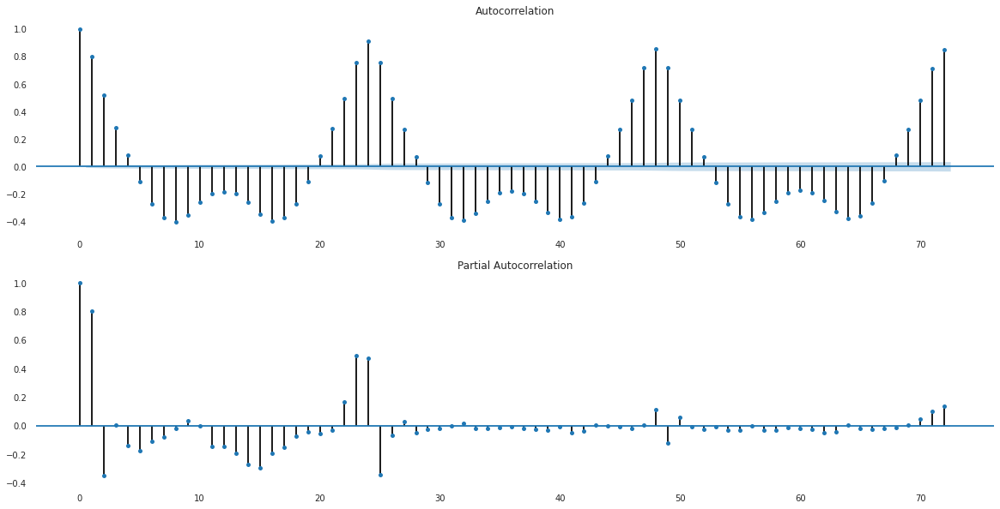

In [0]:
fig,ax = plt.subplots(2,1,figsize=(20,10))
fig = sm.graphics.tsa.plot_acf( train['AEP_MW'].diff().dropna(), lags=72, ax=ax[0])
fig = sm.graphics.tsa.plot_pacf(train['AEP_MW'].diff().dropna(), lags=72, ax=ax[1])
plt.show()

Above plots expose the daily recurring element (each lag is an hour, with spikes at the 24, 48, and 72 marks). If you want to know how much energy is going to be used tomorrow, changes are high it will be highly correlated to today's levels.

#LSTM

Scaling Data

In [0]:
from sklearn.preprocessing import MinMaxScaler
scaler = MinMaxScaler()
scaler.fit(train[['AEP_MW']])

MinMaxScaler(copy=True, feature_range=(0, 1))

In [0]:
scaled_train = scaler.transform(train[['AEP_MW']])
scaled_test = scaler.transform(test[['AEP_MW']])

To apply LSTM on time Series Data it must be transformed to a certain format. Keras has a built in function for that, TimeseriesGenerator.

In [0]:
from keras.preprocessing.sequence import TimeseriesGenerator
n_input = 12
n_features = 1
generator = TimeseriesGenerator(scaled_train, scaled_train, length=n_input, batch_size=1)

Using TensorFlow backend.


In [0]:
from keras.models import Sequential
import tensorflow as tf

from keras.layers import Dense
from keras.layers import LSTM

In [0]:
model = Sequential()
model.add(LSTM(100, activation='relu', input_shape=(n_input, n_features)))
model.add(Dense(1))
model.compile(optimizer='adam', loss='mse')

In [0]:
model.fit_generator(generator,epochs=10)

Epoch 1/10
70116/70116 [==============================] - 340s 5ms/step - loss: 5.9259e-04
Epoch 2/10
70116/70116 [==============================] - 334s 5ms/step - loss: 3.0354e-04
Epoch 3/10
70116/70116 [==============================] - 338s 5ms/step - loss: 2.7403e-04
Epoch 4/10
70116/70116 [==============================] - 335s 5ms/step - loss: 2.5465e-04
Epoch 5/10
70116/70116 [==============================] - 336s 5ms/step - loss: 2.4472e-04
Epoch 6/10
70116/70116 [==============================] - 332s 5ms/step - loss: 2.3676e-04
Epoch 7/10
70116/70116 [==============================] - 326s 5ms/step - loss: 2.2926e-04
Epoch 8/10
70116/70116 [==============================] - 321s 5ms/step - loss: 2.2370e-04
Epoch 9/10
70116/70116 [==============================] - 326s 5ms/step - loss: 2.2020e-04
Epoch 10/10
70116/70116 [==============================] - 321s 5ms/step - loss: 2.1619e-04


Loss Graph

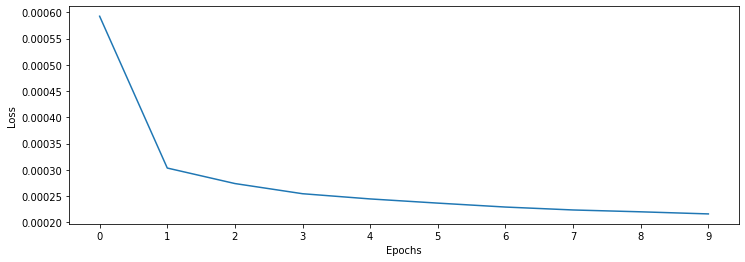

In [0]:
losses_lstm = model.history.history['loss']
plt.figure(figsize=(12,4))
plt.xlabel("Epochs")
plt.ylabel("Loss")
plt.xticks(np.arange(0,21,1))
plt.plot(range(len(losses_lstm)),losses_lstm);

Prediction

In [0]:
lstm_predictions_scaled = list()

batch = scaled_train[-n_input:]
current_batch = batch.reshape((1, n_input, n_features))

for i in range(len(test)):   
    lstm_pred = model.predict(current_batch)[0]
    lstm_predictions_scaled.append(lstm_pred) 
    current_batch = np.append(current_batch[:,1:,:],[[lstm_pred]],axis=1)

Lets transform the prediction back to un-scaled version as we previously scaled our data.

In [0]:
lstm_predictions = scaler.inverse_transform(lstm_predictions_scaled)
lstm_predictions

array([[15057.01020318],
       [14107.68728477],
       [13427.40252769],
       ...,
       [15801.71224278],
       [16129.01990795],
       [16185.22855747]])

In [0]:
test['LSTM_Predictions'] = lstm_predictions
test.head(2)

,AEP_MW,dow,doy,year,month,quarter,hour,weekday,woy,dom,date,season,LSTM_Predictions
2017-08-01 00:00:00,14900.0,1,213,2017,8,3,0,Tuesday,31,1,2017-08-01,3,15057.010203
2017-08-01 01:00:00,13638.0,1,213,2017,8,3,1,Tuesday,31,1,2017-08-01,3,14107.687285


In [0]:
fig = go.Figure()
fig.add_trace(go.Scatter(x=test['AEP_MW'].index, y=test['AEP_MW'],
                         mode='lines',
                         name='Test - Ground Truth'))
fig.add_trace(go.Scatter(x=test['LSTM_Predictions'].index, y=test['LSTM_Predictions'],
                         mode='lines', 
                         name='Test - Prediction'))

fig.update_traces(line=dict(width=0.5))
fig.update_layout(title='LSTM Model Prediction of Hourly Energy Demand',
                  xaxis_title='Date & Time (yyyy/mm/dd hh:MM)',
                  yaxis_title='Energy Demand [MW]')

In [0]:
mape_lstm = get_mape(test['AEP_MW'],test['LSTM_Predictions'])
print('Our Triple Exponential Smoothening has a mean average percentage error of', mape_lstm)

Our Triple Exponential Smoothening has a mean average percentage error of 14.08


In [0]:
from sklearn.metrics import mean_squared_error
from statsmodels.tools.eval_measures import rmse
lstm_rmse = rmse(test['AEP_MW'], test["LSTM_Predictions"])
lstm_mse = lstm_rmse**2
mean_value = df['AEP_MW'].mean()

print(f'MSE Error: {lstm_mse}\nRMSE Error: {lstm_rmse}\nMean: {mean_value}')

MSE Error: 6489598.041457146
RMSE Error: 2547.4689480849706
Mean: 15499.149699907664


#Refrences:
1. For Auto_reg Model, https://machinelearningmastery.com/autoregression-models-time-series-forecasting-python/
2. Installing Pandas profiling for EDA on Dats, https://www.youtube.com/watch?v=pLxgt20kKWU & https://github.com/pandas-profiling/pandas-profiling
3. Using LSTM, https://medium.com/@cdabakoglu/time-series-forecasting-arima-lstm-prophet-with-python-e73a750a9887
